In [1]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.model_selection import train_test_split

In [2]:
# Create a path
path = r'C:\Users\Asus-Pc\Desktop\CareerFoundry\Machine Learning with Python'

In [3]:
# Import cleaned dataset
df_cleaned = pd.read_csv(os.path.join(path, 'df_cleaned.csv'), index_col = False)
df_cleaned

,Unnamed: 0,BASEL_cloud_cover,STOCKHOLM_humidity,MUNCHENB_pressure,KASSEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,0,7,0.98,1.0304,8,0.85,1.0180,0.32,0.09,0.7,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,1,6,0.62,1.0292,6,0.84,1.0180,0.36,1.05,1.1,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,2,8,0.69,1.0320,8,0.90,1.0180,0.18,0.30,0.0,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,3,0.98,1.0443,6,0.92,1.0180,0.58,0.00,4.1,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,4,6,0.96,1.0430,7,0.95,1.0180,0.65,0.14,5.4,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,22945,1,0.98,1.0263,4,0.79,1.0248,1.34,0.22,7.7,...,14.2,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22946,22946,6,1.00,1.0263,3,0.77,1.0244,1.34,0.22,5.4,...,14.3,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22947,22947,4,0.85,1.0263,3,0.76,1.0227,1.34,0.22,6.1,...,14.4,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22948,22948,5,0.94,1.0263,3,0.80,1.0212,1.34,0.22,5.8,...,12.4,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5


In [4]:
# Import weather dataset
df_weather = pd.read_csv(os.path.join(path, 'Weather_dataset.csv'), index_col = False)
df_weather

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22946,20221028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22947,20221029,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22948,20221030,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [5]:
# Drop unnecessary columns
df_cleaned = df_cleaned.drop(['Unnamed: 0'], axis=1)

In [6]:
# Copy 'DATE' column from unscaled dataset to clean one
df_cleaned['DATE'] = df_weather['DATE']

In [7]:
df_cleaned

,BASEL_cloud_cover,STOCKHOLM_humidity,MUNCHENB_pressure,KASSEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,DATE
0,7,0.98,1.0304,8,0.85,1.0180,0.32,0.09,0.7,6.5,...,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9,19600101
1,6,0.62,1.0292,6,0.84,1.0180,0.36,1.05,1.1,6.1,...,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1,19600102
2,8,0.69,1.0320,8,0.90,1.0180,0.18,0.30,0.0,8.5,...,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9,19600103
3,3,0.98,1.0443,6,0.92,1.0180,0.58,0.00,4.1,6.3,...,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6,19600104
4,6,0.96,1.0430,7,0.95,1.0180,0.65,0.14,5.4,3.0,...,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4,19600105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,1,0.98,1.0263,4,0.79,1.0248,1.34,0.22,7.7,15.9,...,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,20221027
22946,6,1.00,1.0263,3,0.77,1.0244,1.34,0.22,5.4,16.7,...,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,20221028
22947,4,0.85,1.0263,3,0.76,1.0227,1.34,0.22,6.1,16.7,...,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,20221029
22948,5,0.94,1.0263,3,0.80,1.0212,1.34,0.22,5.8,15.4,...,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5,20221030


In [8]:
#Reduce cleaned dataset to a decade (1980s)
df_80s = df_cleaned[df_cleaned['DATE'].astype(str).str.contains('198')] 
df_80s

,BASEL_cloud_cover,STOCKHOLM_humidity,MUNCHENB_pressure,KASSEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,DATE
7305,6,0.64,1.0276,3,0.83,1.0180,0.40,0.01,1.6,-0.8,...,6,0.90,1.0130,0.17,0.05,0.0,4.4,2.1,6.0,19800101
7306,5,0.55,1.0333,3,0.84,1.0180,0.34,0.09,0.9,-1.7,...,7,0.89,1.0195,0.12,1.48,0.0,6.4,1.0,11.5,19800102
7307,8,0.68,1.0415,1,0.80,1.0180,0.44,0.07,2.0,-0.6,...,8,0.95,1.0058,0.13,0.60,0.0,9.2,6.2,12.2,19800103
7308,8,0.69,1.0396,2,0.94,1.0180,0.18,0.43,0.0,-0.9,...,5,0.80,1.0034,0.30,0.50,1.5,7.7,5.8,9.2,19800104
7309,8,0.72,1.0273,7,0.90,1.0180,0.25,0.26,0.2,3.0,...,7,0.79,1.0134,0.22,0.03,0.1,7.6,6.1,9.5,19800105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10953,6,0.93,1.0264,7,0.87,1.0157,0.49,0.00,4.0,-0.9,...,6,0.79,1.0105,0.22,0.12,0.1,6.0,1.8,10.1,19891227
10954,3,0.83,1.0298,3,0.84,1.0196,0.54,0.00,6.4,-1.1,...,8,0.84,1.0134,0.18,0.05,0.3,9.3,7.5,11.0,19891228
10955,4,0.83,1.0361,2,0.85,1.0224,0.52,0.00,5.5,-1.7,...,8,0.86,1.0110,0.12,1.10,0.0,10.1,8.8,11.4,19891229
10956,0,0.80,1.0343,8,0.83,1.0233,0.57,0.00,6.6,-2.1,...,8,0.84,1.0138,0.16,0.49,0.1,9.9,8.2,10.8,19891230


In [9]:
# Drop unnecessary columns
df_80s = df_80s.drop(['DATE'], axis=1)
df_80s

,BASEL_cloud_cover,STOCKHOLM_humidity,MUNCHENB_pressure,KASSEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
7305,6,0.64,1.0276,3,0.83,1.0180,0.40,0.01,1.6,-0.8,...,1.1,6,0.90,1.0130,0.17,0.05,0.0,4.4,2.1,6.0
7306,5,0.55,1.0333,3,0.84,1.0180,0.34,0.09,0.9,-1.7,...,-1.2,7,0.89,1.0195,0.12,1.48,0.0,6.4,1.0,11.5
7307,8,0.68,1.0415,1,0.80,1.0180,0.44,0.07,2.0,-0.6,...,-5.0,8,0.95,1.0058,0.13,0.60,0.0,9.2,6.2,12.2
7308,8,0.69,1.0396,2,0.94,1.0180,0.18,0.43,0.0,-0.9,...,-5.4,5,0.80,1.0034,0.30,0.50,1.5,7.7,5.8,9.2
7309,8,0.72,1.0273,7,0.90,1.0180,0.25,0.26,0.2,3.0,...,0.2,7,0.79,1.0134,0.22,0.03,0.1,7.6,6.1,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10953,6,0.93,1.0264,7,0.87,1.0157,0.49,0.00,4.0,-0.9,...,4.0,6,0.79,1.0105,0.22,0.12,0.1,6.0,1.8,10.1
10954,3,0.83,1.0298,3,0.84,1.0196,0.54,0.00,6.4,-1.1,...,2.2,8,0.84,1.0134,0.18,0.05,0.3,9.3,7.5,11.0
10955,4,0.83,1.0361,2,0.85,1.0224,0.52,0.00,5.5,-1.7,...,0.4,8,0.86,1.0110,0.12,1.10,0.0,10.1,8.8,11.4
10956,0,0.80,1.0343,8,0.83,1.0233,0.57,0.00,6.6,-2.1,...,-0.5,8,0.84,1.0138,0.16,0.49,0.1,9.9,8.2,10.8


#### Random Forest Model

In [10]:
tf.random.set_seed(42)

In [11]:
#Reduce weather dataset to a decade (1980s)
df_80s_weather = df_weather[df_weather['DATE'].astype(str).str.contains('198')] 
df_80s_weather

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
7305,19800101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7306,19800102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7307,19800103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7308,19800104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7309,19800105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10953,19891227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10954,19891228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10955,19891229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10956,19891230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [12]:
# Drop unnecessary columns
df_80s_weather = df_80s_weather.drop(['DATE'], axis=1)
df_80s_weather

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
7305,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7306,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7307,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7308,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7309,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10954,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10955,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10956,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [13]:
# Choose data only for Oslo in the 80s
df_80s_Oslo = df_80s_weather['OSLO_pleasant_weather']

In [14]:
X = df_80s
y = df_80s_Oslo
X

,BASEL_cloud_cover,STOCKHOLM_humidity,MUNCHENB_pressure,KASSEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
7305,6,0.64,1.0276,3,0.83,1.0180,0.40,0.01,1.6,-0.8,...,1.1,6,0.90,1.0130,0.17,0.05,0.0,4.4,2.1,6.0
7306,5,0.55,1.0333,3,0.84,1.0180,0.34,0.09,0.9,-1.7,...,-1.2,7,0.89,1.0195,0.12,1.48,0.0,6.4,1.0,11.5
7307,8,0.68,1.0415,1,0.80,1.0180,0.44,0.07,2.0,-0.6,...,-5.0,8,0.95,1.0058,0.13,0.60,0.0,9.2,6.2,12.2
7308,8,0.69,1.0396,2,0.94,1.0180,0.18,0.43,0.0,-0.9,...,-5.4,5,0.80,1.0034,0.30,0.50,1.5,7.7,5.8,9.2
7309,8,0.72,1.0273,7,0.90,1.0180,0.25,0.26,0.2,3.0,...,0.2,7,0.79,1.0134,0.22,0.03,0.1,7.6,6.1,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10953,6,0.93,1.0264,7,0.87,1.0157,0.49,0.00,4.0,-0.9,...,4.0,6,0.79,1.0105,0.22,0.12,0.1,6.0,1.8,10.1
10954,3,0.83,1.0298,3,0.84,1.0196,0.54,0.00,6.4,-1.1,...,2.2,8,0.84,1.0134,0.18,0.05,0.3,9.3,7.5,11.0
10955,4,0.83,1.0361,2,0.85,1.0224,0.52,0.00,5.5,-1.7,...,0.4,8,0.86,1.0110,0.12,1.10,0.0,10.1,8.8,11.4
10956,0,0.80,1.0343,8,0.83,1.0233,0.57,0.00,6.6,-2.1,...,-0.5,8,0.84,1.0138,0.16,0.49,0.1,9.9,8.2,10.8


In [15]:
print(X.shape)
print(y.shape)

(3653, 135)
(3653,)


In [16]:
X = np.array(X)
y = np.array(y)

In [17]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [18]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [19]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.9904240766073872


In [20]:
pred = ['Bad weather','Good weather']

[Text(0.2692775974025974, 0.9642857142857143, 'x[125] <= 15.05\ngini = 0.231\nsamples = 1833\nvalue = [2533, 389]\nclass = Bad weather'),
 Text(0.09740259740259741, 0.8928571428571429, 'x[107] <= 9.55\ngini = 0.023\nsamples = 1265\nvalue = [2012, 24]\nclass = Bad weather'),
 Text(0.07142857142857142, 0.8214285714285714, 'x[108] <= 18.05\ngini = 0.008\nsamples = 1228\nvalue = [1966, 8]\nclass = Bad weather'),
 Text(0.05844155844155844, 0.75, 'gini = 0.0\nsamples = 1222\nvalue = [1966, 0]\nclass = Bad weather'),
 Text(0.08441558441558442, 0.75, 'gini = 0.0\nsamples = 6\nvalue = [0, 8]\nclass = Good weather'),
 Text(0.12337662337662338, 0.8214285714285714, 'x[98] <= 12.95\ngini = 0.383\nsamples = 37\nvalue = [46, 16]\nclass = Bad weather'),
 Text(0.11038961038961038, 0.75, 'x[51] <= 2.695\ngini = 0.274\nsamples = 34\nvalue = [46, 9]\nclass = Bad weather'),
 Text(0.07792207792207792, 0.6785714285714286, 'x[81] <= 12.4\ngini = 0.208\nsamples = 31\nvalue = [45, 6]\nclass = Bad weather'),
 Te

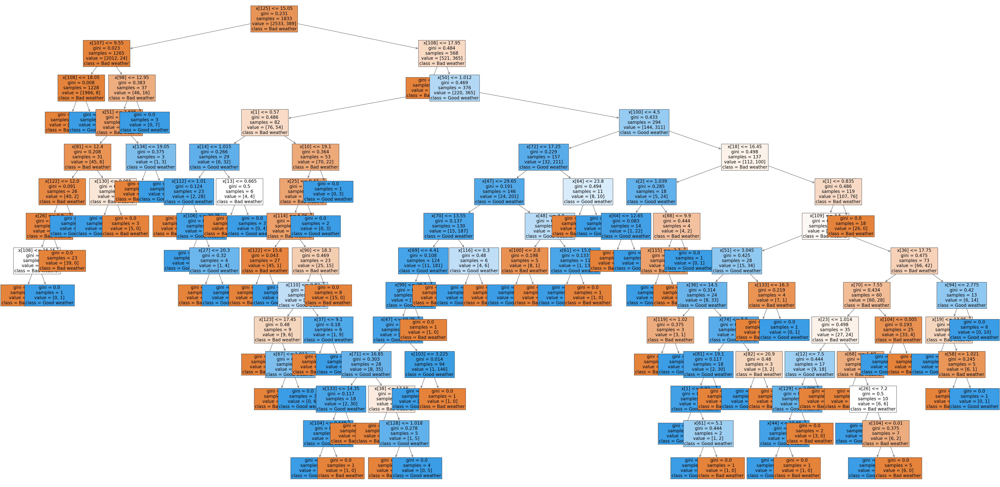

In [21]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [22]:
fig.savefig(f"{path}/decision_tree1.png")

[Text(0.5388093443858327, 0.9666666666666667, 'x[106] <= 14.15\ngini = 0.268\nsamples = 1862\nvalue = [2457, 465]\nclass = Bad weather'),
 Text(0.3180105501130369, 0.9, 'x[120] <= 2.415\ngini = 0.066\nsamples = 1476\nvalue = [2241, 79]\nclass = Bad weather'),
 Text(0.24642049736247174, 0.8333333333333334, 'x[132] <= 17.25\ngini = 0.031\nsamples = 1387\nvalue = [2149, 34]\nclass = Bad weather'),
 Text(0.22230595327807084, 0.7666666666666667, 'x[51] <= 3.17\ngini = 0.023\nsamples = 1376\nvalue = [2135, 25]\nclass = Bad weather'),
 Text(0.21024868123587037, 0.7, 'x[56] <= 20.95\ngini = 0.02\nsamples = 1375\nvalue = [2135, 22]\nclass = Bad weather'),
 Text(0.15523737754333083, 0.6333333333333333, 'x[64] <= 26.15\ngini = 0.009\nsamples = 1297\nvalue = [2033, 9]\nclass = Bad weather'),
 Text(0.1175584024114544, 0.5666666666666667, 'x[59] <= 3.27\ngini = 0.008\nsamples = 1295\nvalue = [2031, 8]\nclass = Bad weather'),
 Text(0.07837226827430294, 0.5, 'x[10] <= 6.75\ngini = 0.007\nsamples = 129

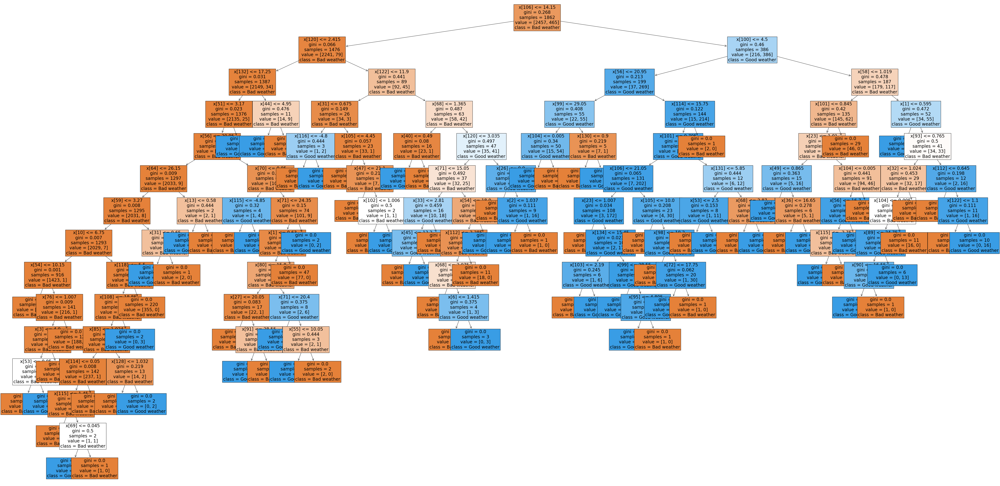

In [23]:
# Generate another decision tree
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[99], fontsize = 20, class_names=pred, filled=True)

In [24]:
fig.savefig(f"{path}/decision_tree2.png")

In [25]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.00107445, 0.01692738, 0.00243699, 0.00053889, 0.00157634,
       0.00210819, 0.00190773, 0.0011373 , 0.00145812, 0.00574607,
       0.00284803, 0.00333274, 0.00108155, 0.00197317, 0.00190842,
       0.00210499, 0.00064397, 0.0016647 , 0.00227955, 0.00364063,
       0.00175418, 0.00133628, 0.00157777, 0.00292271, 0.00447511,
       0.0008146 , 0.00245926, 0.00271068, 0.00220035, 0.00180393,
       0.00140075, 0.00288362, 0.00372036, 0.00255954, 0.00170721,
       0.00264338, 0.02860718, 0.00439284, 0.020446  , 0.00136756,
       0.002377  , 0.00216572, 0.00289614, 0.00143166, 0.00156121,
       0.00886062, 0.00270739, 0.00244605, 0.00112118, 0.00349395,
       0.00369538, 0.00537944, 0.00100358, 0.00238172, 0.01040714,
       0.00244967, 0.03028822, 0.00257574, 0.00266025, 0.00229018,
       0.00141244, 0.00222011, 0.01716137, 0.00482506, 0.00877468,
       0.00110172, 0.00136292, 0.0017371 , 0.00242077, 0.00091399,
       0.00224733, 0.00507757, 0.00358925, 0.00368435, 0.00086

In [26]:
np.set_printoptions(threshold=1000)

In [33]:
newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[0.00107445, 0.01692738, 0.00243699, 0.00053889, 0.00157634,
         0.00210819, 0.00190773, 0.0011373 , 0.00145812],
        [0.00574607, 0.00284803, 0.00333274, 0.00108155, 0.00197317,
         0.00190842, 0.00210499, 0.00064397, 0.0016647 ],
        [0.00227955, 0.00364063, 0.00175418, 0.00133628, 0.00157777,
         0.00292271, 0.00447511, 0.0008146 , 0.00245926],
        [0.00271068, 0.00220035, 0.00180393, 0.00140075, 0.00288362,
         0.00372036, 0.00255954, 0.00170721, 0.00264338],
        [0.02860718, 0.00439284, 0.020446  , 0.00136756, 0.002377  ,
         0.00216572, 0.00289614, 0.00143166, 0.00156121],
        [0.00886062, 0.00270739, 0.00244605, 0.00112118, 0.00349395,
         0.00369538, 0.00537944, 0.00100358, 0.00238172],
        [0.01040714, 0.00244967, 0.03028822, 0.00257574, 0.00266025,
         0.00229018, 0.00141244, 0.00222011, 0.01716137],
        [0.00482506, 0.00877468, 0.00110172, 0.00136292, 0.0017371 ,
         0.00242077, 0.00091399, 0.0022473

In [36]:
sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.02916537, 0.02130363, 0.0212601 , 0.02162981, 0.06524532,
       0.03108931, 0.0714651 , 0.02846114, 0.02699711, 0.01948173,
       0.01987833, 0.35396954, 0.13313183, 0.11264811, 0.04427355])

In [37]:
# Create list for weather stations
weather_stations = ['BASEL', 'BELGRADE', 'BUDAPEST', 'DEBILT', 'DUSSELDORF', 
                    'HEATHROW', 'KASSEL', 'LJUBLJANA', 'MAASTRICHT', 'MADRID', 
                    'MUNCHENB', 'OSLO', 'SONNBLICK', 'STOCKHOLM', 'VALENTIA']

In [38]:
important = pd.Series(sumarray, index = weather_stations) #.sort_values(ascending = False)
important

BASEL         0.029165
BELGRADE      0.021304
BUDAPEST      0.021260
DEBILT        0.021630
DUSSELDORF    0.065245
HEATHROW      0.031089
KASSEL        0.071465
LJUBLJANA     0.028461
MAASTRICHT    0.026997
MADRID        0.019482
MUNCHENB      0.019878
OSLO          0.353970
SONNBLICK     0.133132
STOCKHOLM     0.112648
VALENTIA      0.044274
dtype: float64

['BASEL', 'BELGRADE', 'BUDAPEST', 'DEBILT', 'DUSSELDORF', 'HEATHROW', 'KASSEL', 'LJUBLJANA', 'MAASTRICHT', 'MADRID', 'MUNCHENB', 'OSLO', 'SONNBLICK', 'STOCKHOLM', 'VALENTIA']


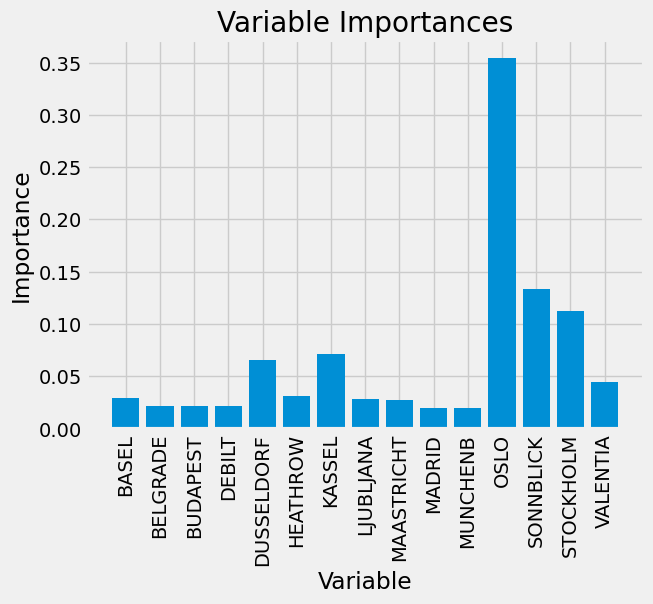

In [42]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(weather_stations)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, weather_stations, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### It seems that the top 3 weather stations, regarding to importance, are Oslo, Sonnblock and Stockholm

### Oslo weather station 

In [47]:
list(df_cleaned.columns)

['BASEL_cloud_cover',
 'STOCKHOLM_humidity',
 'MUNCHENB_pressure',
 'KASSEL_cloud_cover',
 'BASEL_humidity',
 'BASEL_pressure',
 'BASEL_global_radiation',
 'BASEL_precipitation',
 'BASEL_sunshine',
 'BASEL_temp_mean',
 'BASEL_temp_min',
 'BASEL_temp_max',
 'BELGRADE_cloud_cover',
 'BELGRADE_humidity',
 'BELGRADE_pressure',
 'BELGRADE_global_radiation',
 'BELGRADE_precipitation',
 'BELGRADE_sunshine',
 'BELGRADE_temp_mean',
 'BELGRADE_temp_min',
 'BELGRADE_temp_max',
 'BUDAPEST_cloud_cover',
 'BUDAPEST_humidity',
 'BUDAPEST_pressure',
 'BUDAPEST_global_radiation',
 'BUDAPEST_precipitation',
 'BUDAPEST_sunshine',
 'BUDAPEST_temp_mean',
 'BUDAPEST_temp_min',
 'BUDAPEST_temp_max',
 'DEBILT_cloud_cover',
 'DEBILT_humidity',
 'DEBILT_pressure',
 'DEBILT_global_radiation',
 'DEBILT_precipitation',
 'DEBILT_sunshine',
 'DEBILT_temp_mean',
 'DEBILT_temp_min',
 'DEBILT_temp_max',
 'DUSSELDORF_cloud_cover',
 'DUSSELDORF_humidity',
 'DUSSELDORF_pressure',
 'DUSSELDORF_global_radiation',
 'DUSSELDO

In [5]:
df_Oslo = df_cleaned[['OSLO_cloud_cover',
 'OSLO_humidity',
 'OSLO_pressure',
 'OSLO_global_radiation',
 'OSLO_precipitation',
 'OSLO_sunshine',
 'OSLO_temp_mean',
 'OSLO_temp_min',
 'OSLO_temp_max']]

In [51]:
df_Oslo

,OSLO_cloud_cover,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max
0,8,0.98,0.9978,0.04,1.14,0.0,4.9,3.8,5.9
1,8,0.62,1.0139,0.04,0.00,0.0,3.4,2.8,4.9
2,8,0.69,1.0234,0.04,0.08,0.0,1.9,0.6,3.1
3,8,0.98,1.0244,0.04,0.35,0.0,3.0,0.4,4.9
4,8,0.96,1.0092,0.05,0.26,0.0,3.7,2.9,4.9
...,...,...,...,...,...,...,...,...,...
22945,8,0.98,1.0139,1.06,0.21,0.1,9.7,5.8,12.0
22946,8,1.00,1.0107,1.06,0.21,0.0,10.9,8.8,11.7
22947,3,0.85,1.0082,1.06,0.21,6.8,9.7,7.7,14.2
22948,5,0.94,1.0150,1.06,0.21,2.9,5.9,2.1,8.1


In [6]:
weather_Oslo = df_weather[['OSLO_pleasant_weather']]

In [54]:
weather_Oslo

,OSLO_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [7]:
X = df_Oslo
y = weather_Oslo
X

,OSLO_cloud_cover,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max
0,8,0.98,0.9978,0.04,1.14,0.0,4.9,3.8,5.9
1,8,0.62,1.0139,0.04,0.00,0.0,3.4,2.8,4.9
2,8,0.69,1.0234,0.04,0.08,0.0,1.9,0.6,3.1
3,8,0.98,1.0244,0.04,0.35,0.0,3.0,0.4,4.9
4,8,0.96,1.0092,0.05,0.26,0.0,3.7,2.9,4.9
...,...,...,...,...,...,...,...,...,...
22945,8,0.98,1.0139,1.06,0.21,0.1,9.7,5.8,12.0
22946,8,1.00,1.0107,1.06,0.21,0.0,10.9,8.8,11.7
22947,3,0.85,1.0082,1.06,0.21,6.8,9.7,7.7,14.2
22948,5,0.94,1.0150,1.06,0.21,2.9,5.9,2.1,8.1


In [8]:
print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [9]:
X = np.array(X)
y = np.array(y)

In [10]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [11]:
tf.random.set_seed(42)

In [12]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

C:\Users\Asus-Pc\AppData\Local\Temp\ipykernel_6824\1816474229.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)


RandomForestClassifier()

In [13]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


In [14]:
pred = ['Bad weather','Good weather']

[Text(0.4, 0.875, 'x[8] <= 17.95\ngini = 0.268\nsamples = 11595\nvalue = [15428, 2932]\nclass = Bad weather'),
 Text(0.2, 0.625, 'gini = 0.0\nsamples = 8620\nvalue = [13629, 0]\nclass = Bad weather'),
 Text(0.6, 0.625, 'x[4] <= 0.005\ngini = 0.471\nsamples = 2975\nvalue = [1799, 2932]\nclass = Good weather'),
 Text(0.4, 0.375, 'x[5] <= 0.95\ngini = 0.025\nsamples = 1868\nvalue = [38, 2932]\nclass = Good weather'),
 Text(0.2, 0.125, 'gini = 0.0\nsamples = 23\nvalue = [38, 0]\nclass = Bad weather'),
 Text(0.6, 0.125, 'gini = 0.0\nsamples = 1845\nvalue = [0, 2932]\nclass = Good weather'),
 Text(0.8, 0.375, 'gini = 0.0\nsamples = 1107\nvalue = [1761, 0]\nclass = Bad weather')]

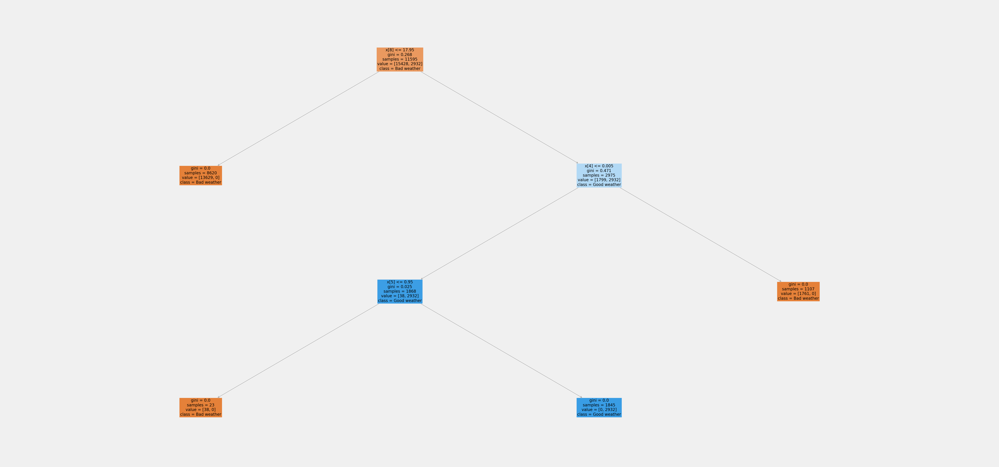

In [63]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [64]:
fig.savefig(f"{path}/decision_tree_Oslo.png")

In [15]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.0246806 , 0.01421626, 0.01122723, 0.0799999 , 0.32213651,
       0.07426696, 0.13194045, 0.04724883, 0.29428327])

In [16]:
np.set_printoptions(threshold=1000)

In [17]:
measurements = [
 'OSLO_cloud_cover',
 'OSLO_humidity',
 'OSLO_pressure',
 'OSLO_global_radiation',
 'OSLO_precipitation',
 'OSLO_sunshine',
 'OSLO_temp_mean',
 'OSLO_temp_min',
 'OSLO_temp_max'
]

In [19]:
important = pd.Series(newarray, index = measurements) #.sort_values(ascending = False)
important

OSLO_cloud_cover         0.024681
OSLO_humidity            0.014216
OSLO_pressure            0.011227
OSLO_global_radiation    0.080000
OSLO_precipitation       0.322137
OSLO_sunshine            0.074267
OSLO_temp_mean           0.131940
OSLO_temp_min            0.047249
OSLO_temp_max            0.294283
dtype: float64

['OSLO_cloud_cover', 'OSLO_humidity', 'OSLO_pressure', 'OSLO_global_radiation', 'OSLO_precipitation', 'OSLO_sunshine', 'OSLO_temp_mean', 'OSLO_temp_min', 'OSLO_temp_max']


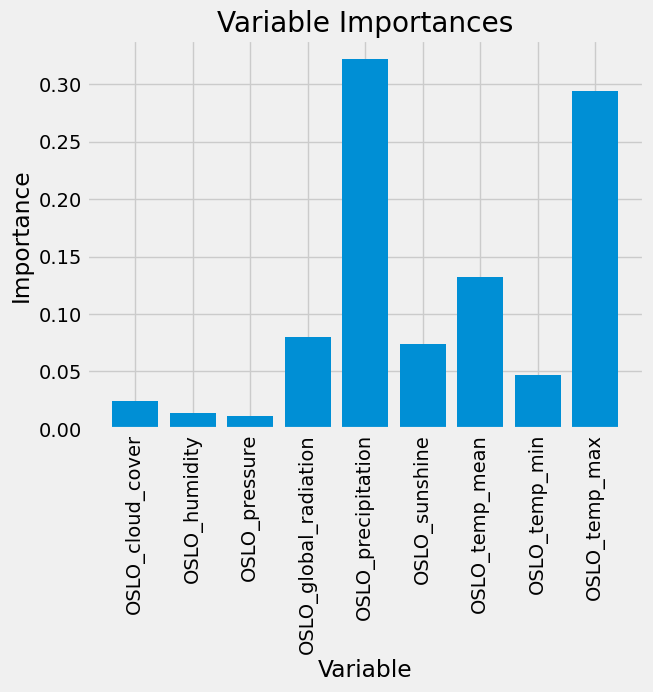

In [20]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(measurements)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, measurements, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### It seems that the 3 most important variables, ragarding Oslo, are: precipitation, temp max and temp mean.

### Sonnblick Weather Station

In [21]:
df_Sonnblick = df_cleaned[['SONNBLICK_cloud_cover',
 'SONNBLICK_humidity',
 'SONNBLICK_pressure',
 'SONNBLICK_global_radiation',
 'SONNBLICK_precipitation',
 'SONNBLICK_sunshine',
 'SONNBLICK_temp_mean',
 'SONNBLICK_temp_min',
 'SONNBLICK_temp_max']]
df_Sonnblick

,SONNBLICK_cloud_cover,SONNBLICK_humidity,SONNBLICK_pressure,SONNBLICK_global_radiation,SONNBLICK_precipitation,SONNBLICK_sunshine,SONNBLICK_temp_mean,SONNBLICK_temp_min,SONNBLICK_temp_max
0,4,0.73,1.0304,0.48,0.01,2.3,-5.9,-8.5,-3.2
1,6,0.97,1.0292,0.21,0.61,0.0,-9.5,-10.5,-8.5
2,8,0.93,1.0320,0.21,3.20,0.0,-9.5,-10.0,-8.9
3,5,0.93,1.0443,0.22,1.10,0.0,-11.5,-12.9,-10.0
4,2,0.75,1.0430,0.72,0.01,6.1,-9.3,-12.0,-6.5
...,...,...,...,...,...,...,...,...,...
22945,2,0.84,1.0263,1.56,0.47,4.7,0.6,-1.4,2.6
22946,5,0.84,1.0263,1.56,0.47,4.7,2.3,0.6,4.0
22947,3,0.84,1.0263,1.56,0.47,4.7,3.3,2.1,4.5
22948,3,0.84,1.0263,1.56,0.47,4.7,3.4,2.7,4.1


In [22]:
weather_Sonnblick = df_weather[['SONNBLICK_pleasant_weather']]
weather_Sonnblick

,SONNBLICK_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [23]:
X = df_Sonnblick
y = weather_Sonnblick

In [24]:
print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [25]:
X = np.array(X)
y = np.array(y)

In [26]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [27]:
tf.random.set_seed(42)

In [28]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

C:\Users\Asus-Pc\AppData\Local\Temp\ipykernel_6824\1816474229.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)


RandomForestClassifier()

In [29]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


In [30]:
pred = ['Bad weather','Good weather']

[Text(0.5, 0.5, 'gini = 0.0\nsamples = 11667\nvalue = 18360.0')]

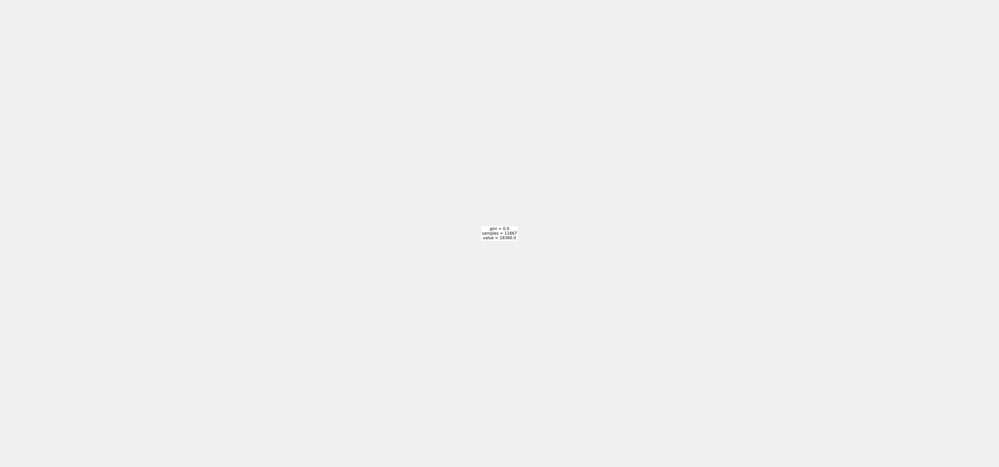

In [31]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [32]:
fig.savefig(f"{path}/decision_tree_Sonnblick.png")

In [33]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [34]:
np.set_printoptions(threshold=1000)

In [35]:
measurements = [
 'SONNBLICK_cloud_cover',
 'SONNBLICK_humidity',
 'SONNBLICK_pressure',
 'SONNBLICK_global_radiation',
 'SONNBLICK_precipitation',
 'SONNBLICK_sunshine',
 'SONNBLICK_temp_mean',
 'SONNBLICK_temp_min',
 'SONNBLICK_temp_max'
]

In [36]:
important = pd.Series(newarray, index = measurements) #.sort_values(ascending = False)
important

SONNBLICK_cloud_cover         0.0
SONNBLICK_humidity            0.0
SONNBLICK_pressure            0.0
SONNBLICK_global_radiation    0.0
SONNBLICK_precipitation       0.0
SONNBLICK_sunshine            0.0
SONNBLICK_temp_mean           0.0
SONNBLICK_temp_min            0.0
SONNBLICK_temp_max            0.0
dtype: float64

['SONNBLICK_cloud_cover', 'SONNBLICK_humidity', 'SONNBLICK_pressure', 'SONNBLICK_global_radiation', 'SONNBLICK_precipitation', 'SONNBLICK_sunshine', 'SONNBLICK_temp_mean', 'SONNBLICK_temp_min', 'SONNBLICK_temp_max']


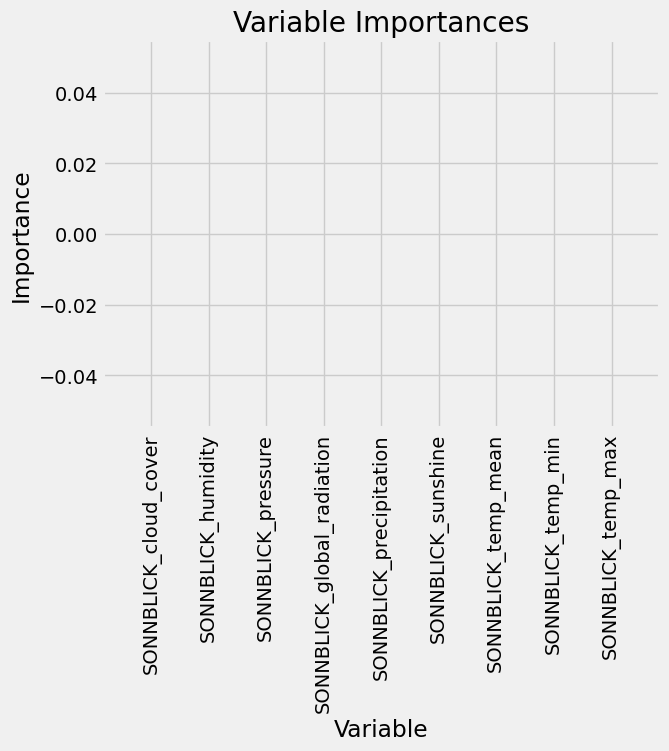

In [37]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(measurements)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, measurements, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### Since Sonnblick is a particular weather station, in which 0 days are labelled as "pleasant", it comes with no suprise that it doesn't have variables that are important. For this reason, I'll be exploring also Kassel weather station, which is the fourth most important.

### Stockholm Weather Station

In [38]:
df_Stockholm = df_cleaned[['STOCKHOLM_cloud_cover',
 'STOCKHOLM_pressure',
 'STOCKHOLM_global_radiation',
 'STOCKHOLM_precipitation',
 'STOCKHOLM_sunshine',
 'STOCKHOLM_temp_mean',
 'STOCKHOLM_temp_min',
 'STOCKHOLM_temp_max']]
df_Stockholm

,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
0,5,1.0114,0.05,0.32,0.0,4.2,2.2,4.9
1,5,1.0114,0.05,0.06,0.0,4.0,3.0,5.0
2,5,1.0114,0.05,0.02,0.0,2.4,1.3,4.1
3,5,1.0114,0.05,0.00,0.0,1.2,0.4,2.3
4,5,1.0114,0.05,1.32,0.0,3.3,0.8,4.3
...,...,...,...,...,...,...,...,...
22945,5,1.0161,1.11,0.14,3.2,11.5,8.2,14.2
22946,5,1.0122,1.11,0.14,0.8,12.5,11.0,14.3
22947,5,1.0059,1.11,0.14,6.9,13.1,12.1,14.4
22948,5,1.0160,1.11,0.14,8.4,7.5,5.1,12.4


In [39]:
weather_Stockholm = df_weather[['STOCKHOLM_pleasant_weather']]
weather_Stockholm

,STOCKHOLM_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [40]:
X = df_Stockholm
y = weather_Stockholm

In [41]:
print(X.shape)
print(y.shape)

(22950, 8)
(22950, 1)


In [42]:
X = np.array(X)
y = np.array(y)

In [43]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [44]:
tf.random.set_seed(42)

In [45]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

C:\Users\Asus-Pc\AppData\Local\Temp\ipykernel_6824\1816474229.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)


RandomForestClassifier()

In [46]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.9995642701525055


In [47]:
pred = ['Bad weather','Good weather']

[Text(0.47843070652173914, 0.9722222222222222, 'x[7] <= 17.95\ngini = 0.285\nsamples = 11621\nvalue = [15194, 3166]\nclass = Bad weather'),
 Text(0.4717417433110368, 0.9166666666666666, 'gini = 0.0\nsamples = 8581\nvalue = [13435, 0]\nclass = Bad weather'),
 Text(0.48511966973244147, 0.9166666666666666, 'x[4] <= 7.65\ngini = 0.459\nsamples = 3040\nvalue = [1759, 3166]\nclass = Good weather'),
 Text(0.21773097826086957, 0.8611111111111112, 'x[0] <= 7.5\ngini = 0.453\nsamples = 1067\nvalue = [1167, 620]\nclass = Bad weather'),
 Text(0.11271948160535117, 0.8055555555555556, 'x[2] <= 0.925\ngini = 0.473\nsamples = 924\nvalue = [954, 596]\nclass = Bad weather'),
 Text(0.026755852842809364, 0.75, 'x[4] <= 1.55\ngini = 0.272\nsamples = 79\nvalue = [98, 19]\nclass = Bad weather'),
 Text(0.013377926421404682, 0.6944444444444444, 'x[4] <= 1.25\ngini = 0.022\nsamples = 62\nvalue = [91, 1]\nclass = Bad weather'),
 Text(0.006688963210702341, 0.6388888888888888, 'gini = 0.0\nsamples = 58\nvalue = [8

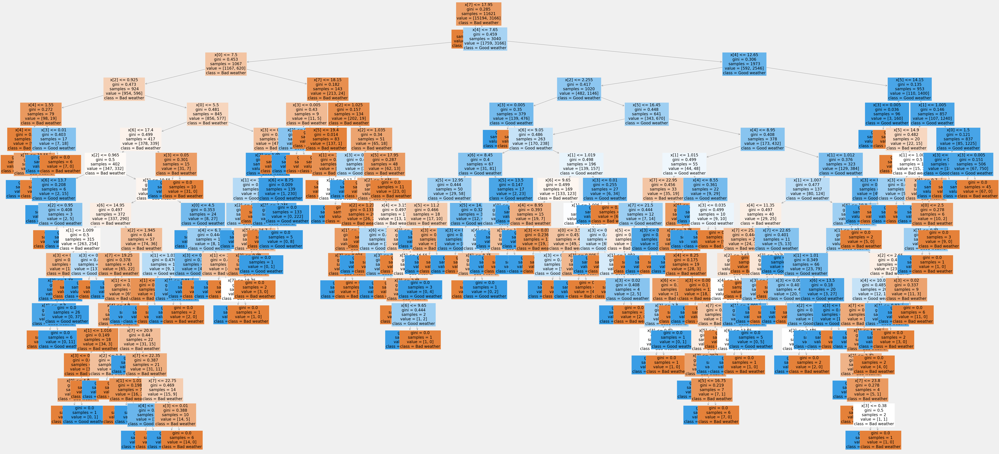

In [48]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [49]:
fig.savefig(f"{path}/decision_tree_Stockholm.png")

In [50]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.01923447, 0.01745688, 0.10382067, 0.26499287, 0.08283304,
       0.16040437, 0.09367273, 0.25758496])

In [51]:
np.set_printoptions(threshold=1000)

In [52]:
measurements = [
 'STOCKHOLM_cloud_cover',
 'STOCKHOLM_pressure',
 'STOCKHOLM_global_radiation',
 'STOCKHOLM_precipitation',
 'STOCKHOLM_sunshine',
 'STOCKHOLM_temp_mean',
 'STOCKHOLM_temp_min',
 'STOCKHOLM_temp_max'
]

In [53]:
important = pd.Series(newarray, index = measurements) #.sort_values(ascending = False)
important

STOCKHOLM_cloud_cover         0.019234
STOCKHOLM_pressure            0.017457
STOCKHOLM_global_radiation    0.103821
STOCKHOLM_precipitation       0.264993
STOCKHOLM_sunshine            0.082833
STOCKHOLM_temp_mean           0.160404
STOCKHOLM_temp_min            0.093673
STOCKHOLM_temp_max            0.257585
dtype: float64

['STOCKHOLM_cloud_cover', 'STOCKHOLM_pressure', 'STOCKHOLM_global_radiation', 'STOCKHOLM_precipitation', 'STOCKHOLM_sunshine', 'STOCKHOLM_temp_mean', 'STOCKHOLM_temp_min', 'STOCKHOLM_temp_max']


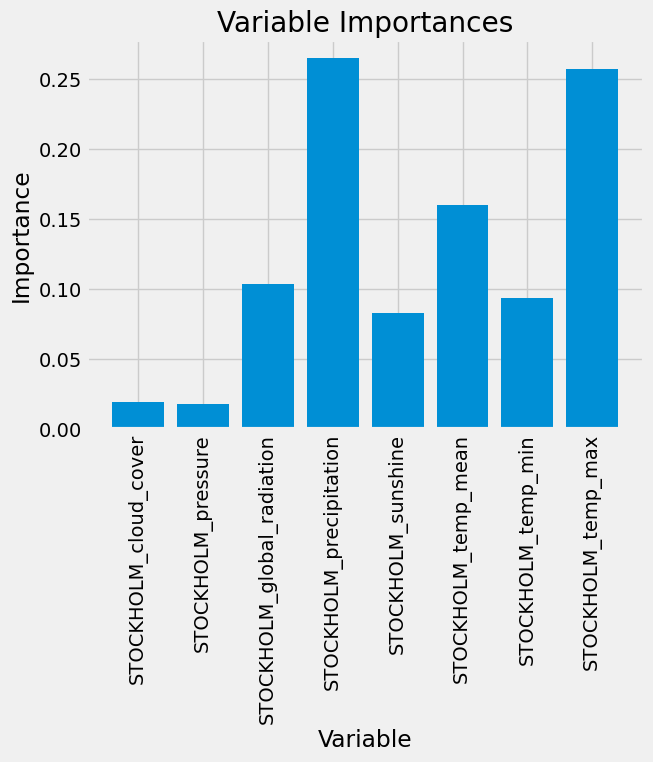

In [54]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(measurements)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, measurements, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### The three most important variables for Stockholm weather station are: precipitation, temp max and temp mean.

### Kassel Weather Station

In [56]:
df_Kassel = df_cleaned[['KASSEL_humidity',
 'KASSEL_pressure',
 'KASSEL_global_radiation',
 'KASSEL_precipitation',
 'KASSEL_sunshine',
 'KASSEL_temp_mean',
 'KASSEL_temp_min',
 'KASSEL_temp_max',]]
df_Kassel

,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max
0,0.82,1.0094,0.28,0.48,1.6,7.9,3.9,9.4
1,0.86,1.0086,0.12,0.27,0.0,7.7,6.8,9.1
2,0.91,1.0129,0.12,0.60,0.0,6.5,6.0,8.0
3,0.87,1.0290,0.12,0.00,0.0,5.8,5.2,6.5
4,0.86,1.0262,0.13,0.71,0.0,5.4,3.7,6.0
...,...,...,...,...,...,...,...,...
22945,0.77,1.0161,1.14,0.19,4.0,9.1,5.4,13.1
22946,0.77,1.0161,1.14,0.19,4.0,9.1,5.4,13.1
22947,0.77,1.0161,1.14,0.19,4.0,9.1,5.4,13.1
22948,0.77,1.0161,1.14,0.19,4.0,9.1,5.4,13.1


In [57]:
weather_Kassel = df_weather[['KASSEL_pleasant_weather']]
weather_Kassel

,KASSEL_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [58]:
X = df_Kassel
y = weather_Kassel

In [59]:
print(X.shape)
print(y.shape)

(22950, 8)
(22950, 1)


In [60]:
X = np.array(X)
y = np.array(y)

In [61]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [62]:
tf.random.set_seed(42)

In [63]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

C:\Users\Asus-Pc\AppData\Local\Temp\ipykernel_6824\1816474229.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)


RandomForestClassifier()

In [64]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


In [65]:
pred = ['Bad weather','Good weather']

[Text(0.5046768707482994, 0.9545454545454546, 'x[5] <= 13.45\ngini = 0.276\nsamples = 11634\nvalue = [15328, 3032]\nclass = Bad weather'),
 Text(0.22874149659863946, 0.8636363636363636, 'x[7] <= 17.95\ngini = 0.047\nsamples = 8451\nvalue = [13016, 318]\nclass = Bad weather'),
 Text(0.2151360544217687, 0.7727272727272727, 'gini = 0.0\nsamples = 8152\nvalue = [12858, 0]\nclass = Bad weather'),
 Text(0.2423469387755102, 0.7727272727272727, 'x[4] <= 4.85\ngini = 0.444\nsamples = 299\nvalue = [158, 318]\nclass = Good weather'),
 Text(0.047619047619047616, 0.6818181818181818, 'x[2] <= 0.87\ngini = 0.35\nsamples = 63\nvalue = [82, 24]\nclass = Bad weather'),
 Text(0.034013605442176874, 0.5909090909090909, 'gini = 0.0\nsamples = 10\nvalue = [18, 0]\nclass = Bad weather'),
 Text(0.061224489795918366, 0.5909090909090909, 'x[5] <= 11.7\ngini = 0.397\nsamples = 53\nvalue = [64, 24]\nclass = Bad weather'),
 Text(0.027210884353741496, 0.5, 'x[1] <= 1.01\ngini = 0.346\nsamples = 4\nvalue = [2, 7]\ncl

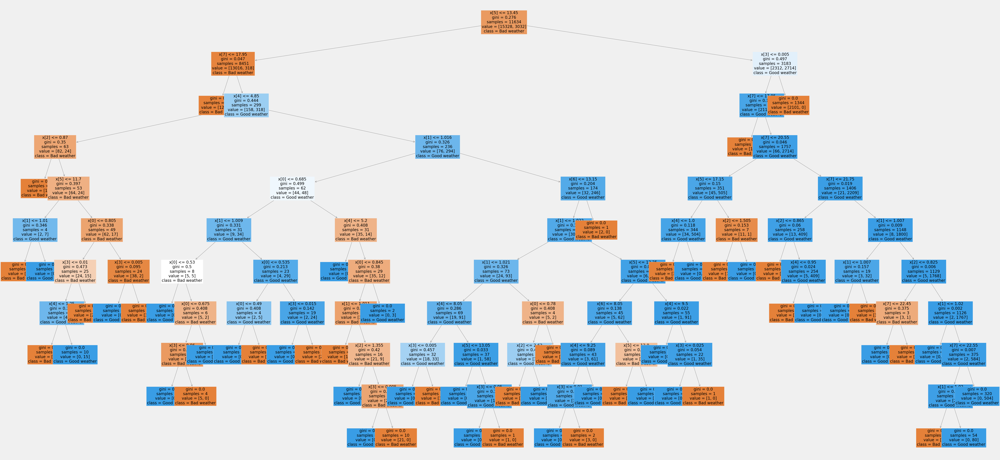

In [66]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [67]:
fig.savefig(f"{path}/decision_tree_Kassel.png")

In [68]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.02298978, 0.02428613, 0.09274115, 0.31929334, 0.09446229,
       0.13240536, 0.01977988, 0.29404207])

In [69]:
np.set_printoptions(threshold=1000)

In [70]:
measurements = [
 'KASSEL_humidity',
 'KASSEL_pressure',
 'KASSEL_global_radiation',
 'KASSEL_precipitation',
 'KASSEL_sunshine',
 'KASSEL_temp_mean',
 'KASSEL_temp_min',
 'KASSEL_temp_max'
]

In [71]:
important = pd.Series(newarray, index = measurements) #.sort_values(ascending = False)
important

KASSEL_humidity            0.022990
KASSEL_pressure            0.024286
KASSEL_global_radiation    0.092741
KASSEL_precipitation       0.319293
KASSEL_sunshine            0.094462
KASSEL_temp_mean           0.132405
KASSEL_temp_min            0.019780
KASSEL_temp_max            0.294042
dtype: float64

['KASSEL_humidity', 'KASSEL_pressure', 'KASSEL_global_radiation', 'KASSEL_precipitation', 'KASSEL_sunshine', 'KASSEL_temp_mean', 'KASSEL_temp_min', 'KASSEL_temp_max']


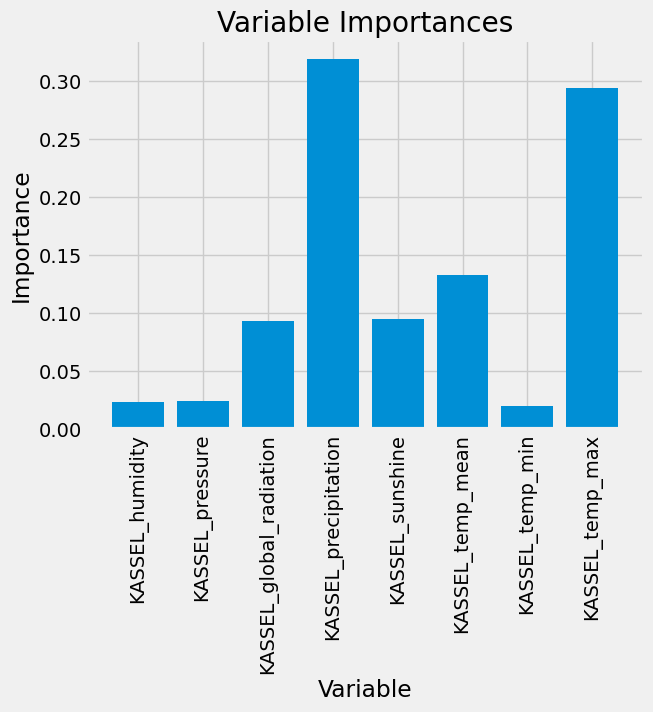

In [72]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(measurements)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, measurements, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### Also for Kassel weather station, the top 3 variables in order of importance are: precipitation, temp max and temp mean.